In [ ]:
import tensorflow as tf
import os
from glob import glob
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Configura las rutas de las imágenes en Google Drive
input_path = '/content/drive/My Drive/AutosIN'  # Ruta a las imágenes de siluetas
output_path = '/content/drive/My Drive/AutosOUT'  # Ruta a las imágenes a color

In [ ]:
# Configuración de parámetros
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3  # Para imágenes a color
LAMBDA = 100

In [ ]:
# Lista solo los archivos PNG en ambas carpetas
input_images = sorted(glob(os.path.join(input_path, '*.png')))
output_images = sorted(glob(os.path.join(output_path, '*.png')))

# Verifica que ambas listas tengan el mismo número de archivos
print(f"Número de imágenes de entrada (siluetas): {len(input_images)}")
print(f"Número de imágenes de salida (color): {len(output_images)}")
assert len(input_images) == len(output_images), "Las carpetas de entrada y salida no tienen el mismo número de imágenes."


Número de imágenes de entrada (siluetas): 63
Número de imágenes de salida (color): 63


In [ ]:
# Funciones para carga y preprocesamiento de imágenes
def load(image_file_input, image_file_output):
    input_image = tf.io.read_file(image_file_input)
    input_image = tf.io.decode_jpeg(input_image, channels=3)

    real_image = tf.io.read_file(image_file_output)
    real_image = tf.io.decode_jpeg(real_image, channels=3)

    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

In [ ]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return input_image, real_image

In [ ]:
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    return input_image, real_image

In [ ]:
# Nueva implementación de random_jitter compatible con Graph mode
def random_jitter(input_image, real_image):
    input_image, real_image = resize(input_image, real_image, 286, 286)
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    input_image, real_image = cropped_image[0], cropped_image[1]

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image


In [ ]:
def load_image_train(image_file_input, image_file_output):
    input_image, real_image = load(image_file_input, image_file_output)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

In [ ]:
def load_image_test(image_file_input, image_file_output):
    input_image, real_image = load(image_file_input, image_file_output)
    input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)
    return input_image, real_image

In [ ]:
# Crea el dataset con los archivos alineados
train_dataset = tf.data.Dataset.from_tensor_slices((input_images, output_images))
train_dataset = train_dataset.map(lambda x, y: load_image_train(x, y), num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                               padding='same',
                                               kernel_initializer=initializer,
                                               use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2,
                                           padding='same', kernel_initializer=initializer,
                                           activation='tanh')
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()


In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')
    x = tf.keras.layers.concatenate([inp, tar])
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer, use_bias=False)(zero_pad1)
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer)(zero_pad2)
    return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()


In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


In [ ]:
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

# Número de pasos de entrenamiento (ajusta según el tiempo y los recursos disponibles)
epochs = 10
for epoch in range(epochs):
    for input_image, target in train_dataset:
        train_step(input_image, target, epoch)


In [ ]:
import datetime

# Define el directorio de logs para TensorBoard
log_dir = "logs/"

# Crea el writer de TensorBoard
summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# Añade la escritura de logs en la función de entrenamiento
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Escribe las métricas en TensorBoard
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step)
        tf.summary.scalar('disc_loss', disc_loss, step=step)


In [ ]:
# Ejecuta TensorBoard
%tensorboard --logdir logs/fit/20241104-221410/events.out.tfevents.1730758450.6d44d03c3e6a.6365.0.v2


<IPython.core.display.Javascript object>

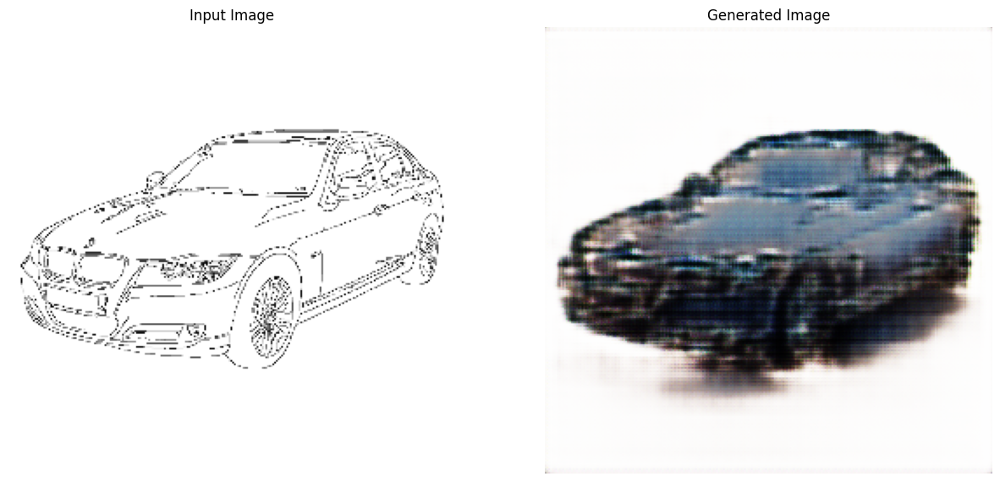

In [ ]:
# Función para generar y mostrar una imagen de prueba
def generate_and_display_image(model, test_input):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Generated Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)  # Reajustar al rango [0, 1]
        plt.axis('off')
    plt.show()

# Cargar y procesar la imagen de prueba
def load_test_image(image_path):
    input_image = tf.io.read_file(image_path)
    input_image = tf.io.decode_jpeg(input_image, channels=3)
    input_image = tf.image.resize(input_image, [IMG_HEIGHT, IMG_WIDTH])
    input_image = (tf.cast(input_image, tf.float32) / 127.5) - 1
    return tf.expand_dims(input_image, 0)  # Añade la dimensión del batch

# Ruta de la imagen de prueba (coloca aquí la ruta de una nueva imagen de silueta en Google Drive)
test_image_path = '/content/silueta_procesada.png'

# Carga la imagen de prueba y genera el resultado
test_input = load_test_image(test_image_path)
generate_and_display_image(generator, test_input)


In [ ]:
# Función para evaluar las métricas en el conjunto de prueba
def evaluate_on_test_set(model, test_dataset):
    gen_loss_avg = 0
    disc_loss_avg = 0
    num_samples = 0

    for input_image, target in test_dataset:
        gen_output = model(input_image, training=False)

        disc_real_output = discriminator([input_image, target], training=False)
        disc_generated_output = discriminator([input_image, gen_output], training=False)

        gen_total_loss, _, _ = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        gen_loss_avg += gen_total_loss
        disc_loss_avg += disc_loss
        num_samples += 1

    gen_loss_avg /= num_samples
    disc_loss_avg /= num_samples

    print(f"Average Generator Loss on Test Set: {gen_loss_avg:.4f}")
    print(f"Average Discriminator Loss on Test Set: {disc_loss_avg:.4f}")

# Ejecuta la evaluación en el conjunto de prueba
evaluate_on_test_set(generator, train_dataset)


Average Generator Loss on Test Set: 78.9545
Average Discriminator Loss on Test Set: 1.5477


In [ ]:
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Escribe las métricas en TensorBoard
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step)
        tf.summary.scalar('disc_loss', disc_loss, step=step)
    print(f"Step {step}: Metrics written to TensorBoard")


In [ ]:
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
summary_writer = tf.summary.create_file_writer(log_dir)


In [ ]:
for step, (input_image, target) in enumerate(train_dataset.take(10)):
    train_step(input_image, target, step)


Step 0: Metrics written to TensorBoard
Step 1: Metrics written to TensorBoard
Step 2: Metrics written to TensorBoard
Step 3: Metrics written to TensorBoard
Step 4: Metrics written to TensorBoard


Step 5: Metrics written to TensorBoard


Step 6: Metrics written to TensorBoard
Step 7: Metrics written to TensorBoard
Step 8: Metrics written to TensorBoard
Step 9: Metrics written to TensorBoard


In [ ]:
%tensorboard --logdir logs/fit/


<IPython.core.display.Javascript object>